In [1]:
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from typing import List
np.set_printoptions(threshold=np.inf)  

from fragment import *
from side import *
from sides_comparison import *
from utils import *
from puzzle import *
from global_values import *
from displaying import *

from skimage.transform import resize


In [2]:
image_path = "colorwheel.jpg" 
output_folder = "fragments"

fragments, TILE_H, TILE_W = divide_image(image_path, output_folder, COL_NR, ROW_NR)

In [3]:

class assembledGroup:

    def __init__(self, sidesComp):
        rows, cols = ROW_NR * 2, COL_NR * 2
        self.grid = [[None for _ in range(cols)] for _ in range(rows)]
        self.used_fragments = []
        self.fragment_positions = {}

        self.used_fragments.append(sidesComp.side1.fragment_idx)
        self.used_fragments.append(sidesComp.side2.fragment_idx)
        if sidesComp.side1.side_idx == 1 and sidesComp.side2.side_idx == 3:
            self.grid[ROW_NR-1][COL_NR-1] = sidesComp.side1.fragment_idx
            self.fragment_positions[sidesComp.side1.fragment_idx] = [ROW_NR-1, COL_NR-1]
            self.grid[ROW_NR-1][COL_NR] = sidesComp.side2.fragment_idx
            self.fragment_positions[sidesComp.side2.fragment_idx] = [ROW_NR-1, COL_NR]

        elif sidesComp.side1.side_idx == 2 and sidesComp.side2.side_idx == 0:
            self.grid[ROW_NR-1][COL_NR-1] = sidesComp.side1.fragment_idx
            self.fragment_positions[sidesComp.side1.fragment_idx] = [ROW_NR-1, COL_NR-1]
            self.grid[ROW_NR][COL_NR-1] = sidesComp.side2.fragment_idx
            self.fragment_positions[sidesComp.side2.fragment_idx] = [ROW_NR, COL_NR-1]

        # print(self.grid)
        # print(self.used_fragments)
        # print(self.fragment_positions)


    def add_fragment(self, fragments, anchor_side, new_side):

        anchor_row, anchor_col = self.fragment_positions[anchor_side.fragment_idx]

        new_fr_row, new_fr_col = find_new_fragment_coords(anchor_side, new_side, anchor_row, anchor_col)

        if self.grid[new_fr_row][new_fr_col] == None:
            # print(f"anchor {anchor_side} neighbouring {new_side}")
            # print(f"anchor row: {anchor_row} col: {anchor_col}")
            # print(f"new fragment row: {new_fr_row} col: {new_fr_col}")

            self.grid[new_fr_row][new_fr_col] = new_side.fragment_idx
            self.fragment_positions[new_side.fragment_idx] = [new_fr_row, new_fr_col]
            self.used_fragments.append(new_side.fragment_idx)


    def show(self, fragments):
        fig, ax = plt.subplots()
        rows, cols = len(self.grid), len(self.grid[0])

        canvas = np.zeros((rows * TILE_W, cols * TILE_H, 3), dtype=np.uint8)

        for i, row in enumerate(self.grid):
            for j, cell in enumerate(row):
                if  cell is not None:
                    fragment = fragments[cell]
                    img = fragment.value[:, :, :3] 
                    h, w = img.shape[:2]
                    
                    if (h, w) != (TILE_H, TILE_W):
                        img_resized = resize(img, (TILE_H, TILE_W), preserve_range=True, anti_aliasing=True)
                    else:
                        img_resized = img

                    top = i * TILE_H
                    left = j * TILE_W
                    canvas[top:top+TILE_H, left:left+TILE_W] = img_resized

        ax.imshow(canvas)
        ax.set_xticks(np.arange(0, canvas.shape[1], TILE_W))
        ax.set_yticks(np.arange(0, canvas.shape[0], TILE_H))
        ax.set_xticks([], minor=True)
        ax.set_yticks([], minor=True)
        ax.grid(which='major', color='white', linewidth=0.5)

        ax.set_xticklabels([])
        ax.set_yticklabels([])
        plt.show()



def merge_groups(comp,fragments, fragment_idx_to_group_idx, groups, anchor_group_idx, pasted_group_idx):
    
    print("------------------------------trying to paste group----------------------------------------------------------")
    print(f"anchor group: {anchor_group_idx} pasted group: {pasted_group_idx}")

    original_first_anchor_row, original_first_anchor_col = groups[anchor_group_idx].fragment_positions[comp.side1.fragment_idx]
    original_first_pasted_row, original_first_pasted_col = groups[pasted_group_idx].fragment_positions[comp.side2.fragment_idx]
    print(f"original_first_anchor_row{original_first_anchor_row} original_first_anchor_col {original_first_anchor_col}")
    print(f"original_first_pasted_row{original_first_pasted_row} original_first_pasted_col {original_first_pasted_col}")

    first_pasted_row, first_pasted_col = find_new_fragment_coords(comp.side1, comp.side2, original_first_anchor_row, original_first_anchor_col)
    print(f"first_pasted_row{first_pasted_row} first_pasted_col {first_pasted_col}")

    moving_dist_row = first_pasted_row - original_first_pasted_row
    moving_dist_col = first_pasted_col - original_first_pasted_col
    print(f"moving_dist_row{moving_dist_row} moving_dist_col {moving_dist_col}")

    for fr_idx in range(len(fragment_idx_to_group_idx)):
        if fragment_idx_to_group_idx[fr_idx] == pasted_group_idx:
            old_row, old_col = groups[pasted_group_idx].fragment_positions[fr_idx]
            new_row = old_row + moving_dist_row
            new_col = old_col + moving_dist_col

            if groups[anchor_group_idx].grid[new_row][new_col] is not None:
                print(f"Cell already occupied at ({new_row}, {new_col})")
                return None, None
            
    for fr_idx in range(len(fragment_idx_to_group_idx)):
        if fragment_idx_to_group_idx[fr_idx] == pasted_group_idx:
            old_row, old_col = groups[pasted_group_idx].fragment_positions[fr_idx]
            new_row = old_row + moving_dist_row
            new_col = old_col + moving_dist_col
            groups[anchor_group_idx].grid[new_row][new_col] = fr_idx
            groups[anchor_group_idx].fragment_positions[fr_idx] = new_row, new_col
            groups[anchor_group_idx].used_fragments.append(fr_idx)
            
            fragment_idx_to_group_idx[fr_idx] = anchor_group_idx
            
    for fr_idx in range(len(fragment_idx_to_group_idx)):
        if fragment_idx_to_group_idx[fr_idx] is not None and fragment_idx_to_group_idx[fr_idx] > pasted_group_idx:
            fragment_idx_to_group_idx[fr_idx] -= 1
    groups.pop(pasted_group_idx)

    return fragment_idx_to_group_idx, groups



def find_new_fragment_coords(anchor_side, new_side, anchor_row, anchor_col):  
    new_fr_row = anchor_row
    new_fr_col = anchor_col
    if anchor_side.side_idx == 1 and new_side.side_idx == 3:
        new_fr_col += 1
    elif anchor_side.side_idx == 3 and new_side.side_idx == 1:
        new_fr_col -= 1
    elif anchor_side.side_idx == 2 and new_side.side_idx == 0:
        new_fr_row += 1

    elif anchor_side.side_idx == 0 and new_side.side_idx == 2:
        new_fr_row -= 1
    
    else:
        print("de implementat rotiri")
        return None
    return new_fr_row, new_fr_col


100%|██████████| 255/255 [00:03<00:00, 71.38it/s] 


Side: fragment_idx=46, side_idx=2 and Side: fragment_idx=62, side_idx=0
Side: fragment_idx=47, side_idx=2 and Side: fragment_idx=63, side_idx=0
Side: fragment_idx=76, side_idx=2 and Side: fragment_idx=92, side_idx=0
Side: fragment_idx=78, side_idx=2 and Side: fragment_idx=94, side_idx=0
Side: fragment_idx=74, side_idx=2 and Side: fragment_idx=90, side_idx=0
Side: fragment_idx=73, side_idx=2 and Side: fragment_idx=89, side_idx=0
Side: fragment_idx=79, side_idx=2 and Side: fragment_idx=95, side_idx=0
Side: fragment_idx=45, side_idx=2 and Side: fragment_idx=61, side_idx=0
Side: fragment_idx=57, side_idx=1 and Side: fragment_idx=58, side_idx=3
Side: fragment_idx=218, side_idx=1 and Side: fragment_idx=219, side_idx=3
Side: fragment_idx=234, side_idx=1 and Side: fragment_idx=235, side_idx=3
Side: fragment_idx=106, side_idx=2 and Side: fragment_idx=122, side_idx=0
Side: fragment_idx=91, side_idx=2 and Side: fragment_idx=107, side_idx=0
Side: fragment_idx=180, side_idx=1 and Side: fragment_idx

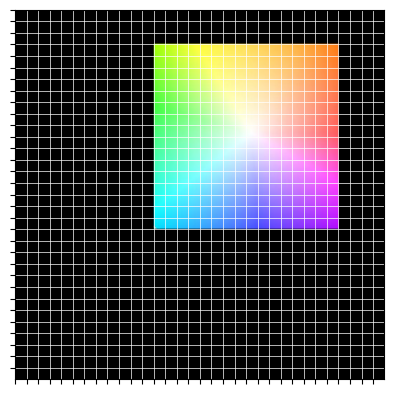

In [4]:

sides_comparisons = create_sides_comparisons(fragments)
sorted_sides_comparisons = sort_sides_comparisons(sides_comparisons)
for s in sorted_sides_comparisons:
    print(f"{s.side1} and {s.side2}")

groups = []
fragment_idx_to_group_idx = [None for fr in fragments]

for s in sorted_sides_comparisons:
    print("-----------------------")
    print(f"{s.side1} and {s.side2}\n\n")

    added_to_a_group = False

    if fragment_idx_to_group_idx[s.side1.fragment_idx] is not None and fragment_idx_to_group_idx[s.side2.fragment_idx] is not None:
        group_idx1 = fragment_idx_to_group_idx[s.side1.fragment_idx]
        group_idx2 = fragment_idx_to_group_idx[s.side2.fragment_idx]
        if group_idx1 == group_idx2:
            continue

            
        new_fragment_idx_to_group_idx, new_groups = merge_groups(s,fragments, fragment_idx_to_group_idx, groups, group_idx1, group_idx2)
        if new_fragment_idx_to_group_idx is not None and new_groups is not None:
            fragment_idx_to_group_idx = new_fragment_idx_to_group_idx
            groups = new_groups

    else:

        if fragment_idx_to_group_idx[s.side1.fragment_idx] is None and fragment_idx_to_group_idx[s.side2.fragment_idx] is None:
            print("new group")
            new_group = assembledGroup(s)
            groups.append(new_group)
            fragment_idx_to_group_idx[s.side1.fragment_idx] = len(groups)-1
            fragment_idx_to_group_idx[s.side2.fragment_idx] = len(groups)-1

            added_to_a_group = True

        else:
            for group_idx, group in enumerate(groups):
                if (
                    s.side1.fragment_idx in group.used_fragments and fragment_idx_to_group_idx[s.side2.fragment_idx] is None
                ):
                    print(f"adding piece to existing group {group_idx}")
                    group.add_fragment(fragments, s.side1, s.side2)
                    fragment_idx_to_group_idx[s.side2.fragment_idx] = group_idx
                    added_to_a_group = True
                    continue
                elif (
                    s.side2.fragment_idx in group.used_fragments and fragment_idx_to_group_idx[s.side1.fragment_idx] is None
                ):
                    print(f"adding piece to existing group {group_idx}")
                    group.add_fragment(fragments, s.side2, s.side1)
                    fragment_idx_to_group_idx[s.side1.fragment_idx] = group_idx
                    added_to_a_group = True
                    continue
        
print(f"fragment to group: {fragment_idx_to_group_idx}")
for group_idx, group in enumerate(groups):
    print(f"group {group_idx}")
    print(f"group fragments: {group.used_fragments}")
    print(f"group positions: {group.fragment_positions}")
    group.show(fragments)



